In [18]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ETFunctions
import matplotlib.dates as mdates
import GraphHelpers as GH
from bisect import bisect_left, bisect_right
%matplotlib inline

In [33]:
CBcolors = {
    'blue':    '#377eb8', 
    'orange':  '#ff7f00',
    'pink':    '#f781bf',
    'brown':   '#a65628',
    'green':   '#4daf4a',
    'purple':  '#984ea3',
    'gray':    '#999999',
    'red':     '#e41a1c',
    'yellow':  '#dede00'
    #'cyan':    '#9edae5'
} 

Categories = ['Fodder','Green manure','Grain', 'Seed', 'Green Vegetable',
         'Pulse Vegetable', 'Fruit Vegetable','Root Vegetable','Potato']
sortDict = dict(zip(Categories,range(9)))

colors = pd.DataFrame(index = Categories,columns=['col'],data = CBcolors.keys())

In [28]:
# Data extracted from CropData.cs InitialiseCropData() method
CropCoefficients = pd.read_csv('CropCoefficientTableFull.csv')
CropCoefficients.set_index(['UniqueName'],inplace=True)

TestCropFilter = CropCoefficients.EndUse != 'Testing'
CropCoefficients = CropCoefficients.loc[TestCropFilter,:]

def makeCategory(enduse, group):
    if enduse in ['Vegetable']:
        return group + " " + enduse
    else:
        return enduse
CropCoefficients.loc[:,'Category'] = [makeCategory(CropCoefficients.loc[x,'EndUse'], CropCoefficients.loc[x,'Group']) for x in CropCoefficients.index]

def makeTypYield(typPopn, typYield, units):
    if units == 't/ha':
        return typYield
    if units == 'kg/head':
        return (typYield * typPopn) / 1000
CropCoefficients.loc[:,'Typical Fresh Yield (t/ha)'] = [makeTypYield(CropCoefficients.loc[x,'Typical Population (/ha)'], 
                                                              CropCoefficients.loc[x,'Typical Yield'],
                                                              CropCoefficients.loc[x,'Typical Yield Units']) for x in CropCoefficients.index]
CropCoefficients.sort_values(by = 'Category', key = lambda x:x.map(sortDict), inplace=True)

In [29]:
#Categories = CropCoefficients.Category.drop_duplicates().values
CatFilt = (CropCoefficients.loc[:,'Category'] != 'Undefined') & (CropCoefficients.loc[:,'Category'] != 'Pasture')
CropCoefficients = CropCoefficients.loc[CatFilt,:]
YieldUnits = CropCoefficients.loc[:,'Typical Yield Units'].drop_duplicates().values


In [30]:
def plotParamDistribution(Graph,var,legloc,valpos):
    Axis = Graph.add_subplot(1,1,1)
    z = 0
    for cat in Categories:
        datafilter = CropCoefficients.loc[:,'Category'] == cat
        data = CropCoefficients.loc[datafilter,var]
        col = colors.loc[cat,'col']
        for c in data.index:
            cYield = data[c]
            Axis.barh(z,cYield,height = 0.7,ec = col,fc='white',lw=5,
                      orientation='horizontal',label=cat)
            plt.plot(cYield+valpos,z,marker=r'$'+str(cYield)+'$',ms=45,color = col)

            if var == 'Typyld':
                plt.text(cYield+6,z-.3,'t/ha ('+CropCoefficients.loc[c,'TypicalYieldUnits']+')',
                         fontsize=15,horizontalalignment='left')
            z -=1
    plt.title(var,fontsize=50)
    plt.yticks(range(-CropCoefficients.index.size+1,1),list(reversed(CropCoefficients.index.values)),
               fontsize=25)
    Axis.spines['right'].set_visible(False)
    Axis.spines['top'].set_visible(False)
    Axis.spines['left'].set_visible(False)
    Axis.spines['bottom'].set_visible(False)
    plt.tick_params(axis='x', which='both', bottom=False,top=False, labelbottom=False)
    plt.ylim(-CropCoefficients.index.size,0.5)
    GH.AddLegend(legloc,26,'Catagory')
    #plt.legend(loc=1)

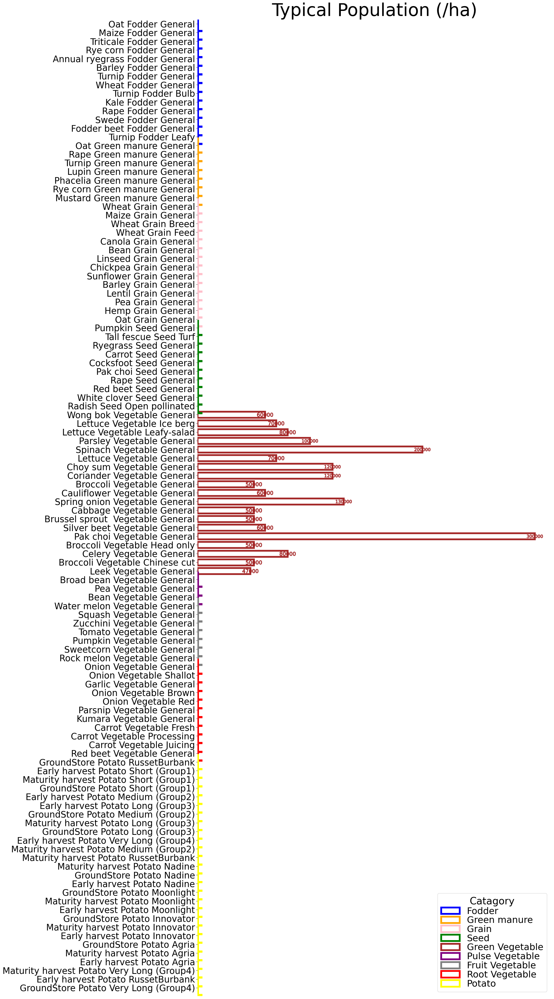

In [31]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Typical Population (/ha)',4,3)
Graph.patch.set_facecolor('white')

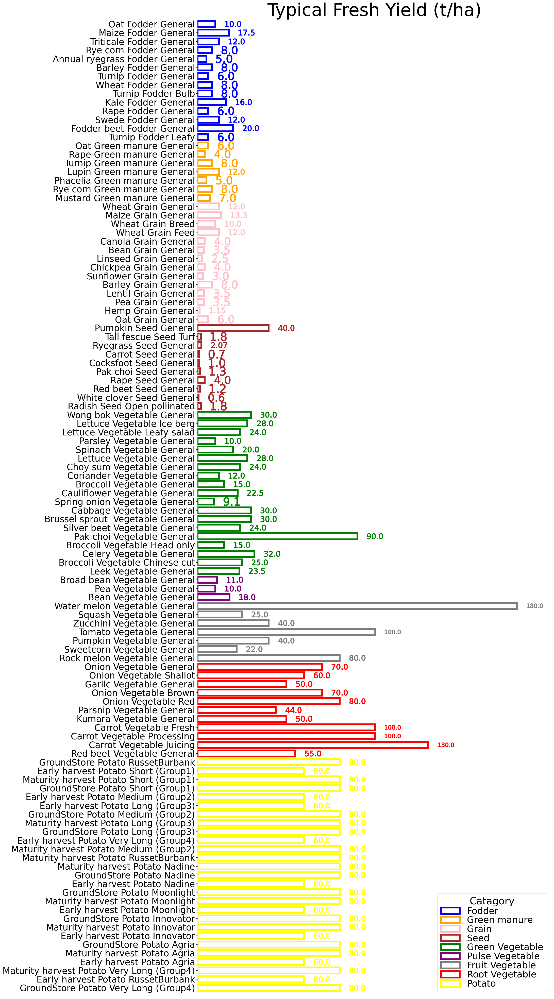

In [34]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Typical Fresh Yield (t/ha)',4,10)
Graph.patch.set_facecolor('white')

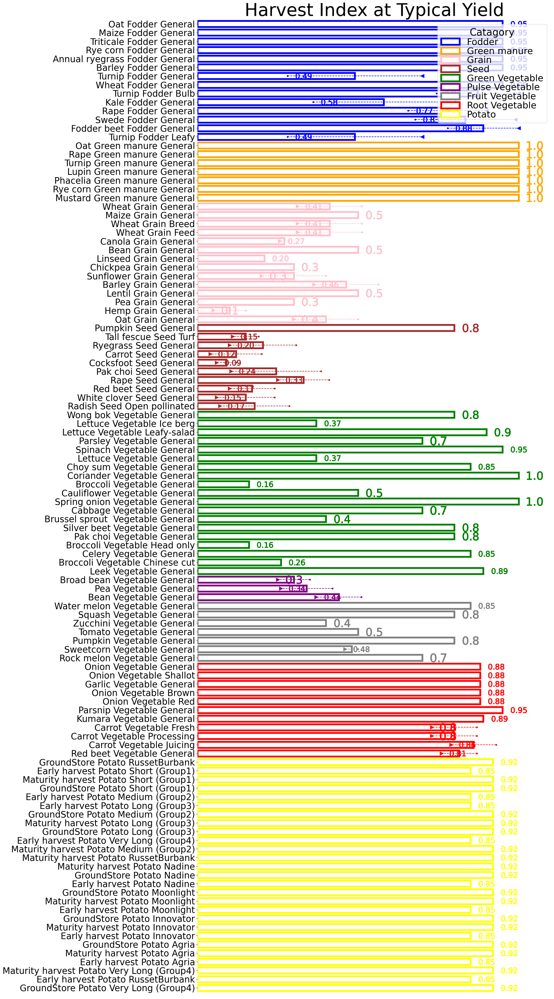

In [37]:
Graph = plt.figure(figsize=(18,50))
Axis = Graph.add_subplot(1,1,1)
z = 0
for cat in Categories:
    datafilter = CropCoefficients.loc[:,'Category'] == cat
    data = CropCoefficients.loc[datafilter,['Typical Fresh Yield (t/ha)', 'Typical HI', 'HI Range']]
    col = colors.loc[cat,'col']
    for c in data.index:
        cHI = data.loc[c,'Typical HI']
        cHIlow = data.loc[c,'Typical HI'] + (data.loc[c,'HI Range'])
        cHIhigh = data.loc[c,'Typical HI'] - (data.loc[c,'HI Range'])
        Axis.barh(z,cHI,height = 0.7,ec = col,fc='white',lw=5,
                  orientation='horizontal',label=cat)
        if data.loc[c,'HI Range'] == 0.0:
            plt.plot(cHI+0.05,z,marker=r'$'+str(cHI)[:4]+'$',ms=45,color = col)
        else:
            plt.plot([cHIlow,cHIhigh],[z,z],'o--',color=col,ms=4)
            if data.loc[c,'HI Range'] > 0.0:
                plt.plot([cHIhigh],[z],'>',color=col,ms=10)
                plt.plot(cHIhigh+0.05,z,marker=r'$'+str(cHI)[:4]+'$',ms=45,color = col)
            else:
                plt.plot([cHIhigh],[z],'<',color=col,ms=10)
                plt.plot(cHIlow+0.05,z,marker=r'$'+str(cHI)[:4]+'$',ms=45,color = col)
        z -=1
plt.title('Harvest Index at Typical Yield',fontsize=50)
plt.yticks(range(-CropCoefficients.index.size+1,1),list(reversed(CropCoefficients.index.values)),
           fontsize=25)
Axis.spines['right'].set_visible(False)
Axis.spines['top'].set_visible(False)
Axis.spines['left'].set_visible(False)
Axis.spines['bottom'].set_visible(False)
plt.tick_params(axis='x', which='both', bottom=False,top=False, labelbottom=False)
plt.ylim(-CropCoefficients.index.size,0.5)
GH.AddLegend(1,26,'Catagory')
Graph.patch.set_facecolor('white')

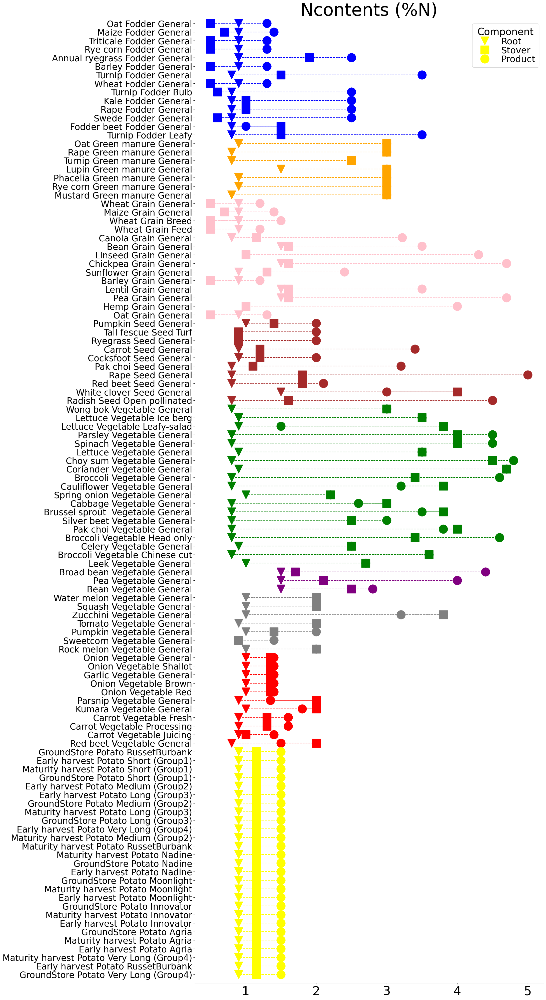

In [39]:
Graph = plt.figure(figsize=(18,50))
Axis = Graph.add_subplot(1,1,1)
z = 0
for cat in Categories:
    datafilter = CropCoefficients.loc[:,'Category'] == cat
    data = CropCoefficients.loc[datafilter,['Root [N]', 'Stover [N]', 'Product [N]']]
    col = colors.loc[cat,'col']
    for c in data.index:
        plt.plot(data.loc[c,'Root [N]'],z,'v',color=col,ms=25,label='Root')
        plt.plot(data.loc[c,'Stover [N]'],z,'s',color=col,ms=25,label='Stover')
        plt.plot(data.loc[c,'Product [N]'],z,'o',color=col,ms=25,label='Product')
        plt.plot([data.loc[c,'Product [N]'],data.loc[c,'Stover [N]'],data.loc[c,'Root [N]']],
                [z,z,z],'--',color=col)
        z -=1
plt.title('Ncontents (%N)',fontsize=50)
plt.yticks(range(-CropCoefficients.index.size+1,1),list(reversed(CropCoefficients.index.values)),
           fontsize=25)
Axis.spines['right'].set_visible(False)
Axis.spines['top'].set_visible(False)
Axis.spines['left'].set_visible(False)
#Axis.spines['bottom'].set_visible(False)
plt.tick_params(axis='x', labelsize=35)
plt.ylim(-CropCoefficients.index.size,0.5)
GH.AddLegend(1,26,'Component')
Graph.patch.set_facecolor('white')

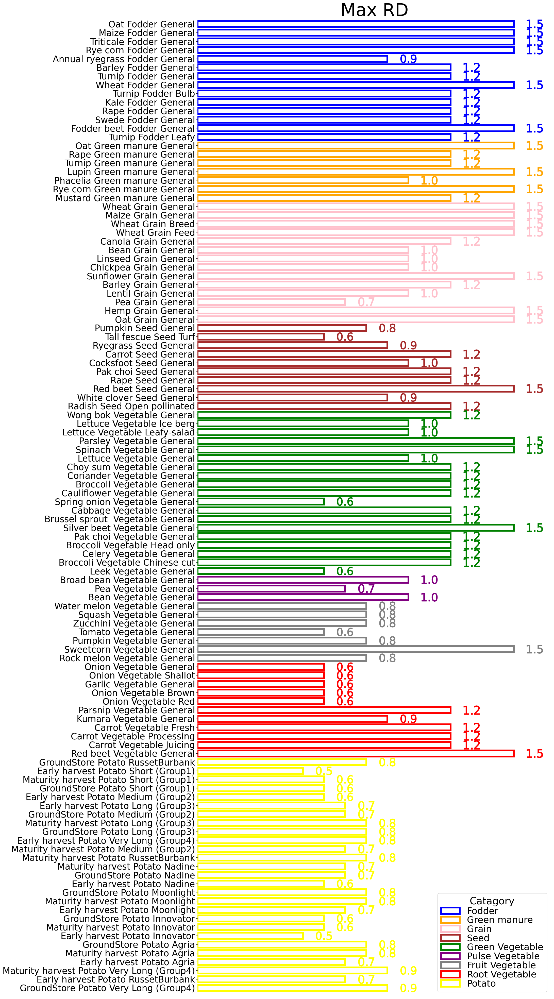

In [41]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Max RD',4,.1)
Graph.patch.set_facecolor('white')

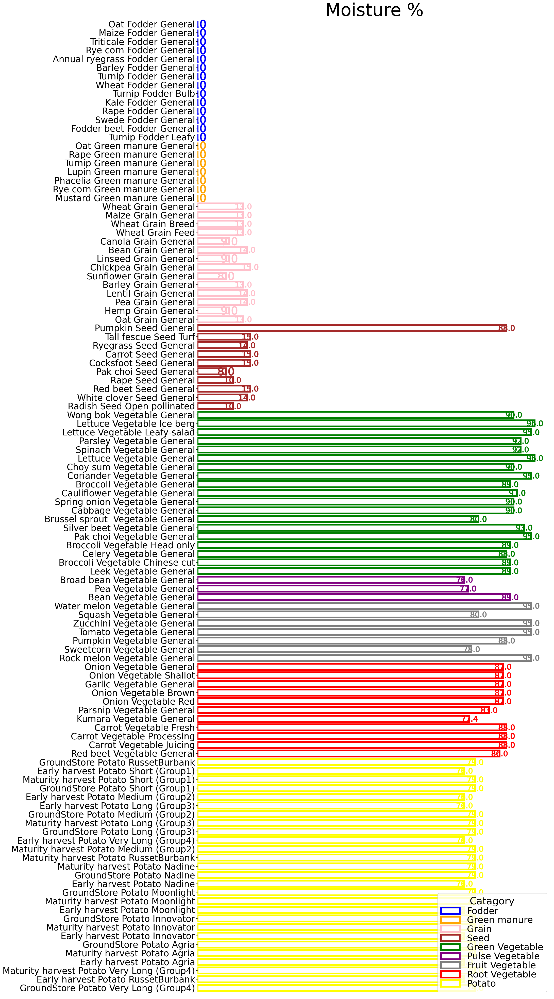

In [42]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'Moisture %',4,.05)
Graph.patch.set_facecolor('white')

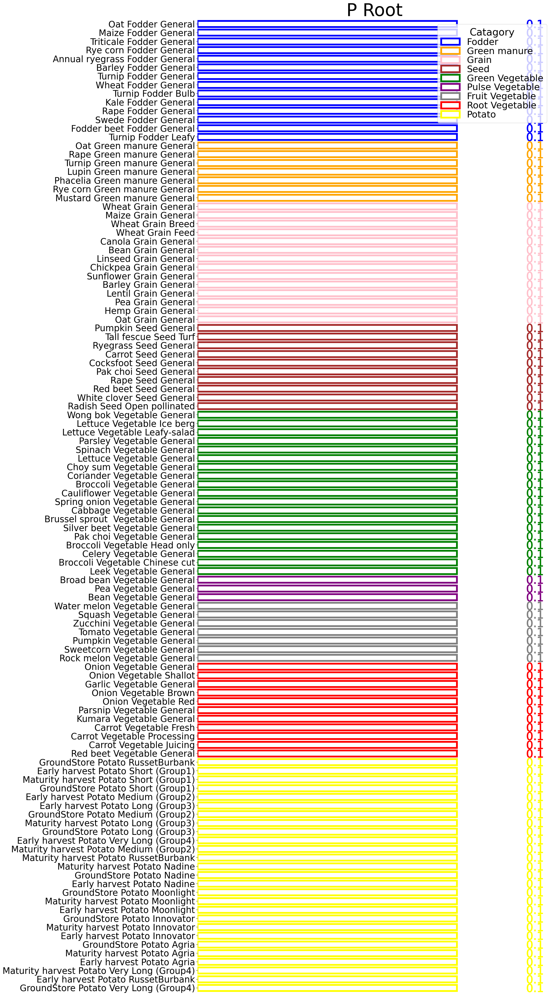

In [43]:
Graph = plt.figure(figsize=(18,50))
plotParamDistribution(Graph,'P Root',1,.03)
Graph.patch.set_facecolor('white')